# OpenCV Effect Filters (Python)

### Importing all necessary librarys (i.e. OpenCV, Numpy, etc!)

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random
from scipy.interpolate import UnivariateSpline
import cv2
print cv2.__version__
%matplotlib inline
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 27
fig_size[1] = 27
plt.rcParams["figure.figsize"] = fig_size

3.4.0


+ ### Sharpening Filter
Build a Kernel from a numpy matrix and use as a 2D Filter to convole with the original image.

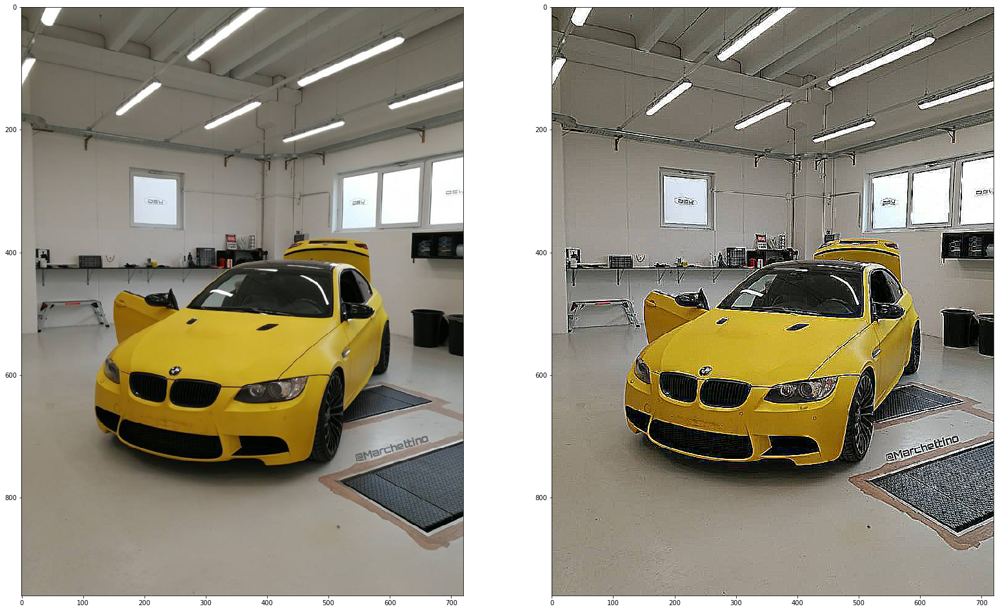

In [2]:
## Sharpening Filter | Sharpen the image with the specified kernel.
def _sharpen(image, kernel):
    output = cv2.filter2D(image, -1, kernel)
    return output

in_img = cv2.imread('input.jpg')
#kernel = np.array([[-1,-1,-1, -1, -1], [-1,-1,-1, -1, -1], [-1, -1, 25, -1, -1], [-1,-1,-1, -1, -1], [-1,-1,-1, -1, -1]])
kernel =  np.array([[-1,-1,-1], [-1, 9,-1], [-1,-1,-1]])
out_img = _sharpen(in_img, kernel)

plt.subplot(121)
plt.imshow(cv2.cvtColor(in_img, cv2.COLOR_BGR2RGB))
plt.subplot(122)
plt.imshow(cv2.cvtColor(out_img, cv2.COLOR_BGR2RGB))
plt.show()

+ ### Noise Filter
Add noise to the original image by using probability and threshold to randomly turn pixels to either black or white.

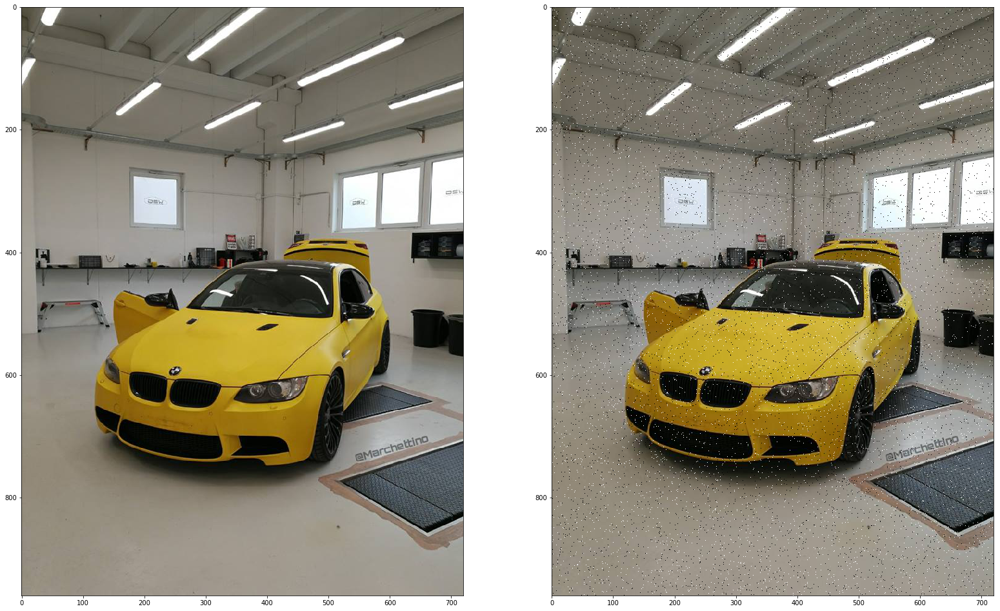

In [3]:
## Noise Filter | Adding pepper noise to an image with probability of noise placement.
def _add_pnoise(image, prob):
    output = np.zeros(image.shape,np.uint8)
    thres = 1 - prob 
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            rdn = random.random()
            if rdn < prob:
                output[i][j] = 0
            elif rdn > thres:
                output[i][j] = 255
            else:
                output[i][j] = image[i][j]
    return output

in_img = cv2.imread('input.jpg')
out_img = _add_pnoise(in_img, 0.01)
plt.subplot(121)
plt.imshow(cv2.cvtColor(in_img, cv2.COLOR_BGR2RGB))
plt.subplot(122)
plt.imshow(cv2.cvtColor(out_img, cv2.COLOR_BGR2RGB))
plt.show()

+ ### Contrast Adjustment
Equalize the contrast of the image across all RGB channels to increase contrast.

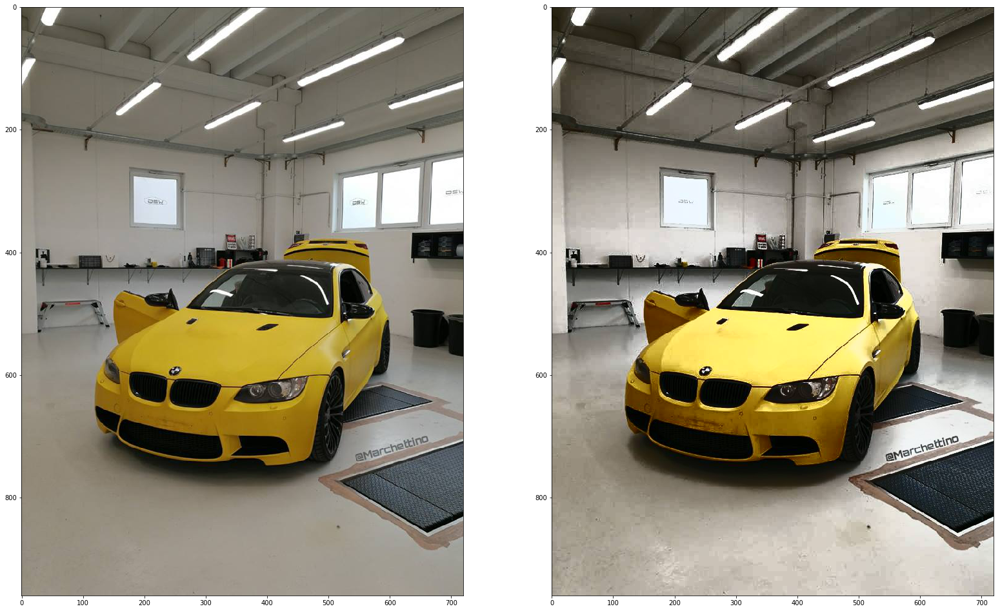

In [4]:
## Contrast Adjustmenet | Equalizes the histogram of an RGB image by converting RGB to YUV and modifiying Y-channel.
def _adjust_contrast(image):   
    img_yuv = cv2.cvtColor(image, cv2.COLOR_BGR2YUV)
    
    # equalize the histogram of the Y channel
    img_yuv[:,:,0] = cv2.equalizeHist(img_yuv[:,:,0])

    # convert the YUV image back to RGB format
    output = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)  
    return output

in_img = cv2.imread('input.jpg')
out_img = _adjust_contrast(in_img)
plt.subplot(121)
plt.imshow(cv2.cvtColor(in_img, cv2.COLOR_BGR2RGB))
plt.subplot(122)
plt.imshow(cv2.cvtColor(out_img, cv2.COLOR_BGR2RGB))
plt.show()

+ ### Color Filter
First, a helper function is used to read the colormap from a file and reform it into R-array, G-array and B-array to copy into the actual Color Filter function.
Second, Color Filter function then uses some pre-specified color maps to apply to the image through a lookup table.
<br/>Colormaps generated from this link: http://jdherman.github.io/colormap/

In [5]:
## Helper function to read color map from a file, then writes to another file the RGB channels' arrays to use.
def _parse_color_map(src, dest):
    # Open a file, read contents and close.
    src_file = open(src, "r")
    line = src_file.readlines()
    src_file.close()

    # Build three strings containing pixel values of all three channels
    R = ""
    G = ""
    B = ""
    for i in range(len(line)):
        result = line[i].split(" ")
        R = R + result[0] + ","
        G = G + result[1] + ","
        B = B + result[2].strip('\n') + ","

    #print "Red: %s" % (R)
    #print "Green: %s" % (G)
    #print "Blue: %s" % (B)

    # Open a file, write the new arrays and close.
    output = open(dest, "w")
    output.write("Red: ")
    output.write(R)
    output.write("\n\nGreen: ") 
    output.write(G)
    output.write("\n\nBlue: ")
    output.write(B)
    output.close()
    
_parse_color_map("input.txt", "output.txt")

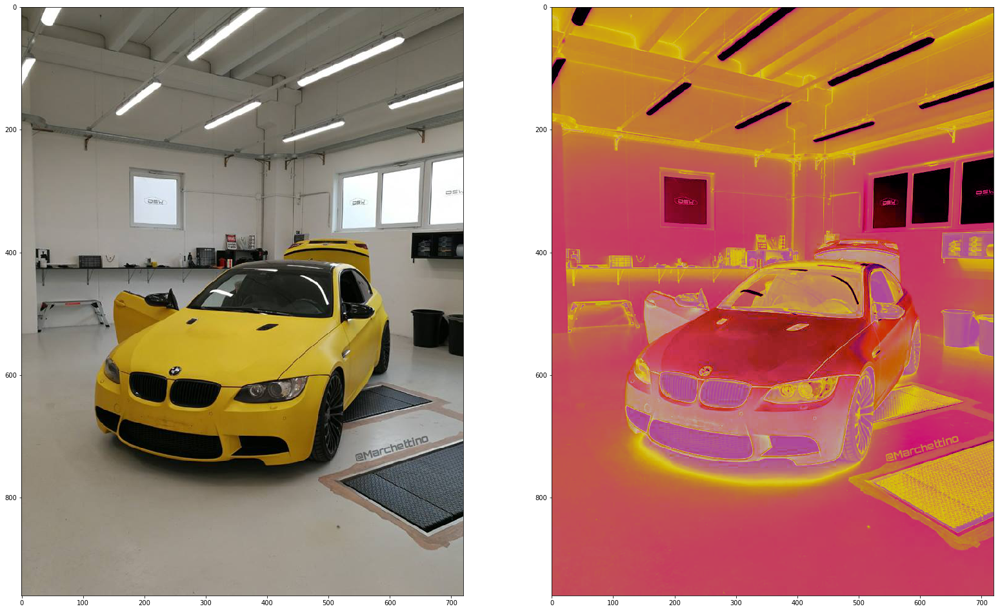

In [6]:
## Color Filter | Changes the color palette of the image to another palette by appying a custom color map.
def _add_color_filter(image, ftype):  
    lut = np.zeros((256, 1, 3), dtype=np.uint8)
    
    if ftype == "Sunburst":
        lut[:, 0, 0] = [0,4,7,11,15,19,22,26,30,33,37,41,45,48,52,56,59,63,67,70,74,78,82,85,89,93,96,100,104,108,111,115,119,122,126,130,134,137,141,145,148,152,156,159,163,167,171,174,178,182,185,189,193,197,200,204,208,211,215,219,223,226,230,234,236,232,229,225,222,218,215,211,208,205,201,198,194,191,187,184,181,177,174,170,167,163,160,156,153,150,146,143,139,136,132,129,125,122,119,115,112,108,105,101,98,94,91,88,84,81,77,74,70,67,63,60,57,53,50,46,43,39,36,32,29,26,22,19,19,22,25,28,31,34,37,40,43,46,49,52,55,58,61,64,67,70,73,76,79,82,85,88,91,94,97,100,103,106,109,112,115,119,122,125,128,131,134,137,140,143,146,149,152,155,158,161,164,167,170,173,176,179,182,185,188,191,194,197,200,203,206,209,208,204,201,198,195,191,188,185,181,178,175,171,168,165,162,158,155,152,148,145,142,138,135,132,129,125,122,119,115,112,109,106,102,99,96,92,89,86,82,79,76,73,69,66,63,59,56,53,49,46,43,40,36,33,30,26,23,20,16,13,10,7,3,0]   
        lut[:, 0, 1] = [116,118,120,122,125,127,129,131,133,136,138,140,142,144,146,149,151,153,155,157,160,162,164,166,168,170,173,175,177,179,181,184,186,188,190,192,194,197,199,201,203,205,208,210,212,214,216,218,221,223,225,227,229,232,234,236,238,240,242,245,247,249,251,253,255,253,252,250,249,247,246,245,243,242,240,239,237,236,234,233,232,230,229,227,226,224,223,221,220,219,217,216,214,213,211,210,208,207,206,204,203,201,200,198,197,196,194,193,191,190,188,187,185,184,183,181,180,178,177,175,174,172,171,170,168,167,165,164,163,162,161,160,159,159,158,157,156,155,154,154,153,152,151,150,149,149,148,147,146,145,145,144,143,142,141,140,140,139,138,137,136,135,135,134,133,132,131,130,130,129,128,127,126,126,125,124,123,122,121,121,120,119,118,117,116,116,115,114,113,112,112,111,109,107,106,104,102,101,99,97,95,94,92,90,88,87,85,83,81,80,78,76,75,73,71,69,68,66,64,62,61,59,57,55,54,52,50,49,47,45,43,42,40,38,36,35,33,31,29,28,26,24,23,21,19,17,16,14,12,10,9,7,5,3,2,0]   
        lut[:, 0, 2] = [80,83,86,89,91,94,97,100,102,105,108,111,113,116,119,122,124,127,130,133,135,138,141,144,146,149,152,155,157,160,163,166,168,171,174,177,179,182,185,188,190,193,196,199,201,204,207,210,212,215,218,221,223,226,229,232,234,237,240,243,245,248,251,254,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,254,254,254,254,254,254,254,254,254,254,254,254,253,253,253,253,253,253,253,253,253,253,253,253,252,252,252,252,252,252,252,252,252,252,252,252,251,251,251,251,251,251,251,251,251,251,251,250,250,250,250,250,249,249,248,248,248,247,247,247,246,246,246,245,245,245,244,244,244,243,243,243,242,242,242,241,241,241,240,240,240,239,239,239,238,238,238,237,237,237,236,236,236,235,235,235,234,234,234,233,233,233,232,232,232,231,231,231,230,230,229,229,229,226,222,219,215,212,208,205,201,197,194,190,187,183,179,176,172,169,165,161,158,154,151,147,144,140,136,133,129,126,122,118,115,111,108,104,100,97,93,90,86,83,79,75,72,68,65,61,57,54,50,47,43,39,36,32,29,25,22,18,14,11,7,4,0]
    
    elif ftype == "Moonlight":
        lut[:, 0, 0] = [53,56,60,63,66,69,72,76,79,82,85,88,91,95,98,101,104,107,110,114,117,120,123,126,130,133,136,139,142,145,149,152,155,158,161,164,168,171,174,177,180,184,187,190,193,196,199,203,206,209,212,215,218,222,225,228,231,234,238,241,244,247,250,253,255,254,253,251,250,249,247,246,245,243,242,241,239,238,237,235,234,233,231,230,229,227,226,224,223,222,220,219,218,216,215,214,212,211,210,208,207,206,204,203,202,200,199,198,196,195,194,192,191,190,188,187,185,184,183,181,180,179,177,176,175,173,172,171,171,172,173,174,176,177,178,180,181,182,183,185,186,187,189,190,191,192,194,195,196,198,199,200,201,203,204,205,207,208,209,210,212,213,214,216,217,218,219,221,222,223,225,226,227,228,230,231,232,234,235,236,237,239,240,241,243,244,245,246,248,249,250,252,250,248,246,243,241,239,237,234,232,230,228,225,223,221,219,216,214,212,210,207,205,203,201,198,196,194,192,189,187,185,183,180,178,176,174,171,169,167,165,162,160,158,156,153,151,149,147,144,142,140,137,135,133,131,128,126,124,122,119,117,115,113,110,108]   
        lut[:, 0, 1] = [52,53,55,56,58,59,61,62,64,65,67,68,70,71,72,74,75,77,78,80,81,83,84,86,87,89,90,92,93,95,96,98,99,101,102,104,105,106,108,109,111,112,114,115,117,118,120,121,123,124,126,127,129,130,132,133,135,136,138,139,141,142,143,145,146,145,143,142,141,140,139,138,137,136,134,133,132,131,130,129,128,126,125,124,123,122,121,120,118,117,116,115,114,113,112,110,109,108,107,106,105,104,102,101,100,99,98,97,96,94,93,92,91,90,89,88,87,85,84,83,82,81,80,79,77,76,75,74,74,76,78,80,82,84,86,87,89,91,93,95,97,99,100,102,104,106,108,110,112,114,115,117,119,121,123,125,127,128,130,132,134,136,138,140,142,143,145,147,149,151,153,155,156,158,160,162,164,166,168,170,171,173,175,177,179,181,183,184,186,188,190,192,191,189,186,184,182,180,178,175,173,171,169,166,164,162,160,158,155,153,151,149,147,144,142,140,138,136,133,131,129,127,125,122,120,118,116,114,111,109,107,105,103,100,98,96,94,91,89,87,85,83,80,78,76,74,72,69,67,65,63,61,58,56,54,52]   
        lut[:, 0, 2] = [69,69,70,71,71,72,72,73,74,74,75,76,76,77,77,78,79,79,80,81,81,82,82,83,84,84,85,85,86,87,87,88,89,89,90,90,91,92,92,93,94,94,95,95,96,97,97,98,98,99,100,100,101,102,102,103,103,104,105,105,106,106,107,108,108,107,107,106,106,105,104,104,103,102,102,101,101,100,99,99,98,98,97,96,96,95,94,94,93,93,92,91,91,90,89,89,88,88,87,86,86,85,85,84,83,83,82,81,81,80,80,79,78,78,77,77,76,75,75,74,73,73,72,72,71,70,70,69,68,68,67,66,65,64,64,63,62,61,61,60,59,58,57,57,56,55,54,53,53,52,51,50,49,49,48,47,46,46,45,44,43,42,42,41,40,39,38,38,37,36,35,34,34,33,32,31,31,30,29,28,27,27,26,25,24,23,23,22,21,20,20,19,19,19,19,19,19,19,19,19,19,19,20,20,20,20,20,20,20,20,20,20,21,21,21,21,21,21,21,21,21,21,22,22,22,22,22,22,22,22,22,22,22,23,23,23,23,23,23,23,23,23,23,24,24,24,24,24,24,24,24,24,24,25,25,25]
    
    elif ftype == "Orion":
        lut[:, 0, 0] = [53,54,55,56,57,58,59,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,121,122,123,124,126,127,128,130,131,132,133,135,136,137,139,140,141,142,144,145,146,148,149,150,151,153,154,155,157,158,159,160,162,163,164,166,167,168,169,171,172,173,175,176,177,178,180,181,182,184,185,186,187,189,190,191,193,194,195,196,198,199,200,200,199,198,197,196,195,194,193,192,191,190,189,188,187,186,185,184,182,181,180,179,178,177,176,175,174,173,172,171,170,169,168,167,166,165,163,162,161,160,159,158,157,156,155,154,153,152,151,150,149,148,147,146,144,143,142,141,140,139,138,137,136,135,134,132,131,129,127,126,124,122,121,119,117,116,114,112,111,109,107,105,104,102,100,99,97,95,94,92,90,89,87,85,84,82,80,79,77,75,73,72,70,68,67,65,63,62,60,58,57,55,53,52,50,48,46,45,43,41,40,38,36,35,33,31,30,28,26]   
        lut[:, 0, 1] = [52,52,53,53,53,54,54,54,55,55,56,56,56,57,57,58,58,58,59,59,60,60,60,61,61,61,62,62,63,63,63,64,64,65,65,65,66,66,67,67,67,68,68,68,69,69,70,70,70,71,71,72,72,72,73,73,73,74,74,75,75,75,76,76,77,78,80,81,83,84,86,87,88,90,91,93,94,96,97,98,100,101,103,104,106,107,109,110,111,113,114,116,117,119,120,122,123,124,126,127,129,130,132,133,135,136,137,139,140,142,143,145,146,148,149,150,152,153,155,156,158,159,161,162,163,165,166,168,169,170,171,172,173,174,174,175,176,177,178,179,180,181,182,183,184,185,185,186,187,188,189,190,191,192,193,194,195,196,197,197,198,199,200,201,202,203,204,205,206,207,208,209,209,210,211,212,213,214,215,216,217,218,219,220,221,221,222,223,224,225,226,227,225,223,221,219,216,214,212,210,207,205,203,200,198,196,194,191,189,187,184,182,180,178,175,173,171,169,166,164,162,159,157,155,153,150,148,146,143,141,139,137,134,132,130,127,125,123,121,118,116,114,112,109,107,105,102,100,98,96,93,91,89,86,84,82]   
        lut[:, 0, 2] = [69,71,73,75,76,78,80,82,84,86,88,90,92,94,96,98,100,102,103,105,107,109,111,113,115,117,119,121,123,125,127,129,130,132,134,136,138,140,142,144,146,148,150,152,154,156,157,159,161,163,165,167,169,171,173,175,177,179,181,182,184,186,188,190,191,191,190,189,188,188,187,186,185,185,184,183,182,182,181,180,179,178,178,177,176,175,175,174,173,172,172,171,170,169,169,168,167,166,165,165,164,163,162,162,161,160,159,159,158,157,156,156,155,154,153,153,152,151,150,149,149,148,147,146,146,145,144,143,143,144,145,145,146,146,147,148,148,149,150,150,151,152,152,153,154,154,155,155,156,157,157,158,159,159,160,161,161,162,163,163,164,164,165,166,166,167,168,168,169,170,170,171,172,172,173,173,174,175,175,176,177,177,178,179,179,180,181,181,182,182,183,184,183,181,180,178,176,175,173,172,170,168,167,165,164,162,160,159,157,156,154,152,151,149,148,146,144,143,141,140,138,136,135,133,132,130,128,127,125,124,122,120,119,117,116,114,112,111,109,108,106,104,103,101,100,98,96,95,93,92,90,88,87,85,84,82]

    elif ftype == "Summer Garden":
        lut[:, 0, 0] = [156,154,151,149,146,144,141,139,137,134,132,129,127,124,122,119,117,114,112,110,107,105,102,100,97,95,92,90,88,85,83,80,78,75,73,70,68,65,63,61,58,56,53,51,48,46,43,41,39,36,34,31,29,26,24,21,19,17,14,12,9,7,4,2,0,2,3,4,6,7,8,10,11,13,14,15,17,18,19,21,22,23,25,26,27,29,30,32,33,34,36,37,38,40,41,42,44,45,46,48,49,51,52,53,55,56,57,59,60,61,63,64,66,67,68,70,71,72,74,75,76,78,79,80,82,83,85,86,87,87,88,88,88,89,89,90,90,91,91,91,92,92,93,93,94,94,94,95,95,96,96,97,97,97,98,98,99,99,99,100,100,101,101,102,102,102,103,103,104,104,105,105,105,106,106,107,107,108,108,108,109,109,110,110,111,111,111,112,112,113,113,113,112,110,109,107,105,103,102,100,98,96,94,93,91,89,87,86,84,82,80,78,77,75,73,71,69,68,66,64,62,61,59,57,55,53,52,50,48,46,45,43,41,39,37,36,34,32,30,29,27,25,23,21,20,18,16,14,12,11,9,7,5,4,2,0]   
        lut[:, 0, 1] = [65,67,69,71,73,76,78,80,82,84,86,88,91,93,95,97,99,101,103,105,108,110,112,114,116,118,120,123,125,127,129,131,133,135,137,140,142,144,146,148,150,152,155,157,159,161,163,165,167,169,172,174,176,178,180,182,184,187,189,191,193,195,197,199,200,199,197,196,194,192,191,189,187,186,184,182,181,179,177,176,174,172,171,169,168,166,164,163,161,159,158,156,154,153,151,149,148,146,144,143,141,140,138,136,135,133,131,130,128,126,125,123,121,120,118,116,115,113,111,110,108,107,105,103,102,100,98,97,95,94,93,91,90,89,88,86,85,84,83,81,80,79,78,76,75,74,72,71,70,69,67,66,65,64,62,61,60,59,57,56,55,54,52,51,50,49,47,46,45,44,42,41,40,38,37,36,35,33,32,31,30,28,27,26,25,23,22,21,20,18,17,16,15,15,15,15,14,14,14,14,13,13,13,13,12,12,12,12,11,11,11,11,10,10,10,10,9,9,9,9,8,8,8,8,8,7,7,7,7,6,6,6,6,5,5,5,5,4,4,4,4,3,3,3,3,2,2,2,2,1,1,1,1,0,0,0]   
        lut[:, 0, 2] = [172,173,174,174,175,176,177,177,178,179,179,180,181,182,182,183,184,184,185,186,187,187,188,189,189,190,191,192,192,193,194,194,195,196,197,197,198,199,199,200,201,202,202,203,204,205,205,206,207,207,208,209,210,210,211,212,212,213,214,215,215,216,217,217,218,217,217,216,216,216,215,215,214,214,213,213,212,212,212,211,211,210,210,209,209,208,208,207,207,207,206,206,205,205,204,204,203,203,203,202,202,201,201,200,200,199,199,199,198,198,197,197,196,196,195,195,194,194,194,193,193,192,192,191,191,190,190,190,189,190,190,190,190,191,191,191,191,192,192,192,192,193,193,193,193,194,194,194,194,195,195,195,195,195,196,196,196,196,197,197,197,197,198,198,198,198,199,199,199,199,200,200,200,200,201,201,201,201,202,202,202,202,203,203,203,203,203,204,204,204,204,205,202,199,196,193,190,186,183,180,177,173,170,167,164,161,157,154,151,148,145,141,138,135,132,128,125,122,119,116,112,109,106,103,100,96,93,90,87,84,80,77,74,71,67,64,61,58,55,51,48,45,42,39,35,32,29,26,22,19,16,13,10,6,3,0]
        
    elif ftype == "Steampunk":
        lut[:, 0, 0] = [53,54,55,56,57,58,59,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,121,122,123,124,126,127,128,130,131,132,133,135,136,137,139,140,141,142,144,145,146,148,149,150,151,153,154,155,157,158,159,160,162,163,164,166,167,168,169,171,172,173,175,176,177,178,180,181,182,184,185,186,187,189,190,191,193,194,195,196,198,199,200,200,199,198,197,196,195,194,193,192,191,190,189,188,187,186,185,184,182,181,180,179,178,177,176,175,174,173,172,171,170,169,168,167,166,165,163,162,161,160,159,158,157,156,155,154,153,152,151,150,149,148,147,146,144,143,142,141,140,139,138,137,136,135,134,132,131,129,127,126,124,122,121,119,117,116,114,112,111,109,107,105,104,102,100,99,97,95,94,92,90,89,87,85,84,82,80,79,77,75,73,72,70,68,67,65,63,62,60,58,57,55,53,52,50,48,46,45,43,41,40,38,36,35,33,31,30,28,26]   
        lut[:, 0, 1] = [52,52,53,53,53,54,54,54,55,55,56,56,56,57,57,58,58,58,59,59,60,60,60,61,61,61,62,62,63,63,63,64,64,65,65,65,66,66,67,67,67,68,68,68,69,69,70,70,70,71,71,72,72,72,73,73,73,74,74,75,75,75,76,76,77,78,80,81,83,84,86,87,88,90,91,93,94,96,97,98,100,101,103,104,106,107,109,110,111,113,114,116,117,119,120,122,123,124,126,127,129,130,132,133,135,136,137,139,140,142,143,145,146,148,149,150,152,153,155,156,158,159,161,162,163,165,166,168,169,170,171,172,173,174,174,175,176,177,178,179,180,181,182,183,184,185,185,186,187,188,189,190,191,192,193,194,195,196,197,197,198,199,200,201,202,203,204,205,206,207,208,209,209,210,211,212,213,214,215,216,217,218,219,220,221,221,222,223,224,225,226,227,225,223,221,219,216,214,212,210,207,205,203,200,198,196,194,191,189,187,184,182,180,178,175,173,171,169,166,164,162,159,157,155,153,150,148,146,143,141,139,137,134,132,130,127,125,123,121,118,116,114,112,109,107,105,102,100,98,96,93,91,89,86,84,82]   
        lut[:, 0, 2] = [69,71,73,75,76,78,80,82,84,86,88,90,92,94,96,98,100,102,103,105,107,109,111,113,115,117,119,121,123,125,127,129,130,132,134,136,138,140,142,144,146,148,150,152,154,156,157,159,161,163,165,167,169,171,173,175,177,179,181,182,184,186,188,190,191,191,190,189,188,188,187,186,185,185,184,183,182,182,181,180,179,178,178,177,176,175,175,174,173,172,172,171,170,169,169,168,167,166,165,165,164,163,162,162,161,160,159,159,158,157,156,156,155,154,153,153,152,151,150,149,149,148,147,146,146,145,144,143,143,144,145,145,146,146,147,148,148,149,150,150,151,152,152,153,154,154,155,155,156,157,157,158,159,159,160,161,161,162,163,163,164,164,165,166,166,167,168,168,169,170,170,171,172,172,173,173,174,175,175,176,177,177,178,179,179,180,181,181,182,182,183,184,183,181,180,178,176,175,173,172,170,168,167,165,164,162,160,159,157,156,154,152,151,149,148,146,144,143,141,140,138,136,135,133,132,130,128,127,125,124,122,120,119,117,116,114,112,111,109,108,106,104,103,101,100,98,96,95,93,92,90,88,87,85,84,82]
        
    output = cv2.LUT(image, lut)
    return output;

in_img = cv2.imread("input.jpg");
out_img = _add_color_filter(in_img, "Summer Garden");
plt.subplot(121)
plt.imshow(cv2.cvtColor(in_img, cv2.COLOR_BGR2RGB))
plt.subplot(122)
plt.imshow(cv2.cvtColor(out_img, cv2.COLOR_BGR2RGB))
plt.show()

+ ### Vignette Filter
Apply a vignette effect by using a gaussian kernel to form a mask then apply that mask to the original image.

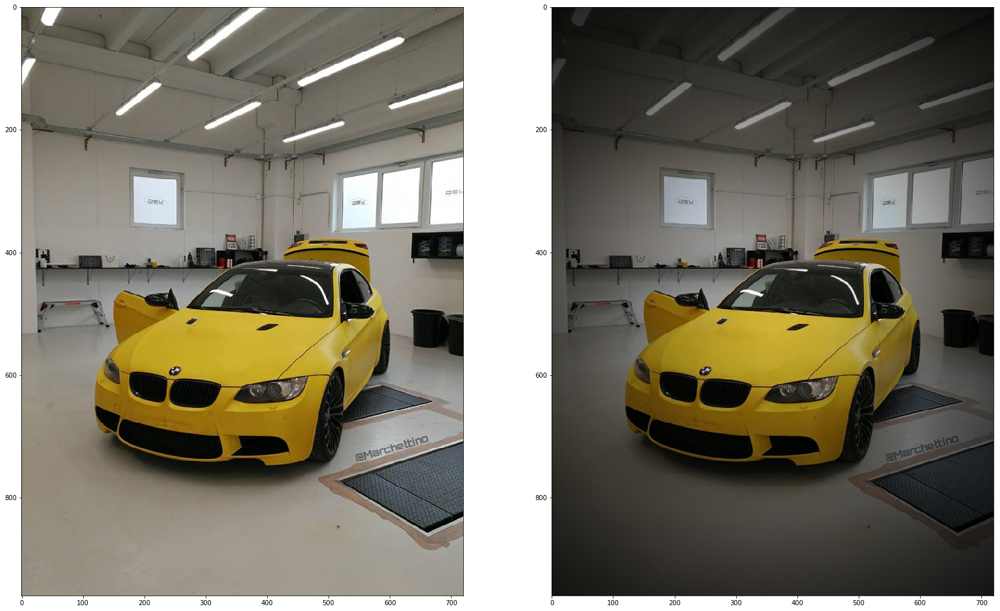

In [7]:
## Vignette Filter | Adds a vignette filter to darken the edges of the image by using gaussian kernels.
def _vignette_filter(image, std_dev, gain):
    # generating vignette mask using Gaussian kernels
    rows, cols = image.shape[:2]
    kernel_x = cv2.getGaussianKernel(cols, std_dev)
    kernel_y = cv2.getGaussianKernel(rows, std_dev)
    kernel = kernel_y * kernel_x.T
    mask = gain * kernel / np.linalg.norm(kernel)
    output = np.copy(image)

    # applying the mask to each channel in the input image
    for i in range(3):
        output[:,:,i] = output[:,:,i] * mask
    return output
    
in_img = cv2.imread('input.jpg')
out_img = _vignette_filter(in_img, 300, 500)
plt.subplot(121)
plt.imshow(cv2.cvtColor(in_img, cv2.COLOR_BGR2RGB))
plt.subplot(122)
plt.imshow(cv2.cvtColor(out_img, cv2.COLOR_BGR2RGB))
plt.show()

+ ### Temperature Filter
First, a helper function is used to construct a lookup table for cool and warm filters to speed up processing.
Second, by increasing or decreasing the red and blue channels across all the pixels, the warm or cool effect is applied.

In [8]:
## Helper function to create a curve by interpolating x and y inputs to create a look-up table for cool and warm filters
def create_LUT_8UC1(x, y):
    spl = UnivariateSpline(x, y)
    return spl(xrange(256))

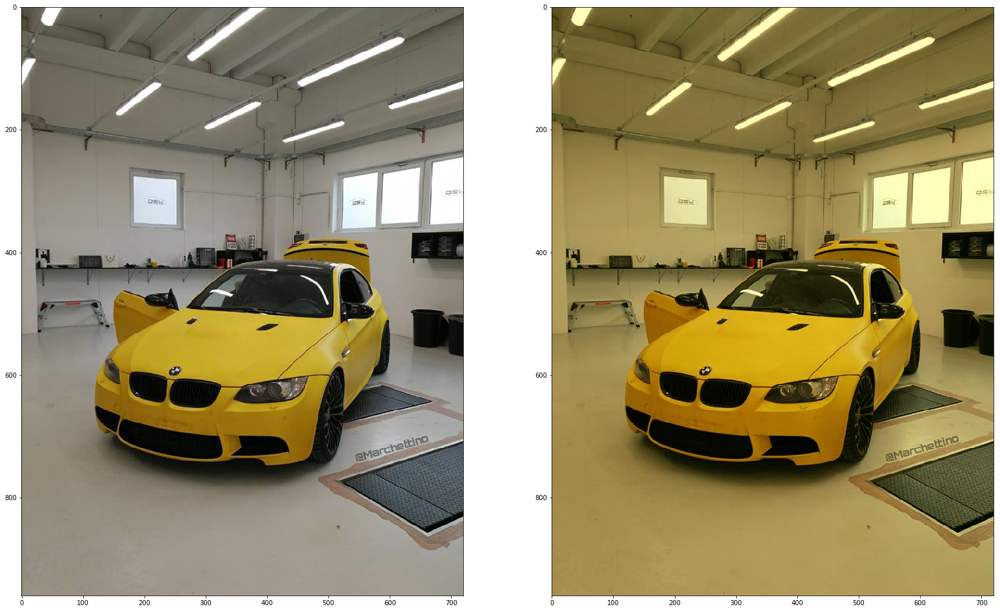

In [9]:
## Temperature Filter | Adds warmness or coolness to the image by increasing/decreasing Red and Blue channels
def _temperature_filter(image, ftype):
    incr_ch_lut = create_LUT_8UC1([0, 64, 128, 192, 256], [0, 70, 140, 210, 256])
    decr_ch_lut = create_LUT_8UC1([0, 64, 128, 192, 256], [0, 30, 80, 120, 192])

    # split the image into the three channels
    c_b, c_g, c_r = cv2.split(image)
    
    if ftype == "cool":
        c_b = cv2.LUT(c_b, incr_ch_lut).astype(np.uint8)
        c_r = cv2.LUT(c_r, decr_ch_lut).astype(np.uint8)
    elif ftype == "warm":
        c_b = cv2.LUT(c_b, decr_ch_lut).astype(np.uint8)
        c_r = cv2.LUT(c_r, incr_ch_lut).astype(np.uint8)
    else:
        c_r = c_r
        c_b = c_b
    
    img_rgb_changed = cv2.merge((c_b, c_g, c_r))
    output = img_rgb_changed
    return output

in_img = cv2.imread("input.jpg")
out_img = _temperature_filter(in_img, "warm")
plt.subplot(121)
plt.imshow(cv2.cvtColor(in_img, cv2.COLOR_BGR2RGB))
plt.subplot(122)
plt.imshow(cv2.cvtColor(out_img, cv2.COLOR_BGR2RGB))
plt.show()

+ ### Cartoonify Filter
Use a bilateral fiilter and adaptive thresholding to create a cartoonish effect. The filter uses multiple light bilateral filters to speedup the process while also being applied on a downscaled version of the image for the same purpose since the process is computationally expensive.

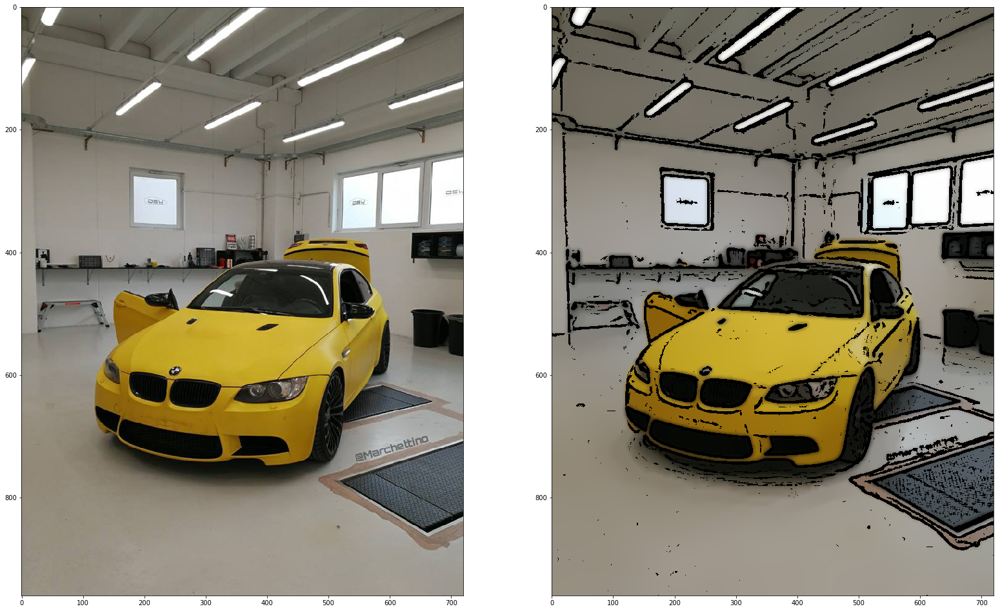

In [10]:
## Cartoonify Filter | Changes the style of the image to look cartoonish by using bilateral filters and thresholding.
def _cartoonify_filter(image):
    numDownSamples = 2       # number of downscaling steps
    numBilateralFilters = 7  # number of bilateral filtering steps

    # downsample image using Gaussian pyramid (downsize the image before applying the filter for speedup)
    img_color = image
    for _ in xrange(numDownSamples):
        img_color = cv2.pyrDown(img_color)

    # repeatedly apply small bilateral filter instead of applying one large filter (speed up the process)
    for _ in xrange(numBilateralFilters):
        img_color = cv2.bilateralFilter(img_color, 9, 9, 7)

    # upsample image to original size (restore the image's original size)
    for _ in xrange(numDownSamples):
        img_color = cv2.pyrUp(img_color)

    # convert to grayscale and apply median blur to reduce noise
    img_gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    img_blur = cv2.medianBlur(img_gray, 7)

    # detect and enhance edges using adaptive thresholding
    img_edge = cv2.adaptiveThreshold(img_blur, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 9, 2)

    # convert back to color so that it can be bit-ANDed with color image
    img_edge = cv2.cvtColor(img_edge, cv2.COLOR_GRAY2RGB)
    output = cv2.bitwise_and(img_color, img_edge)
    return output

in_img = cv2.imread('input.jpg')
out_img = _cartoonify_filter(in_img);
plt.subplot(121)
plt.imshow(cv2.cvtColor(in_img, cv2.COLOR_BGR2RGB))
plt.subplot(122)
plt.imshow(cv2.cvtColor(out_img, cv2.COLOR_BGR2RGB))
plt.show()

+ ### Create Composite Filter
Combine all the above functions to create more complex filters by passing the specific paramters as input.

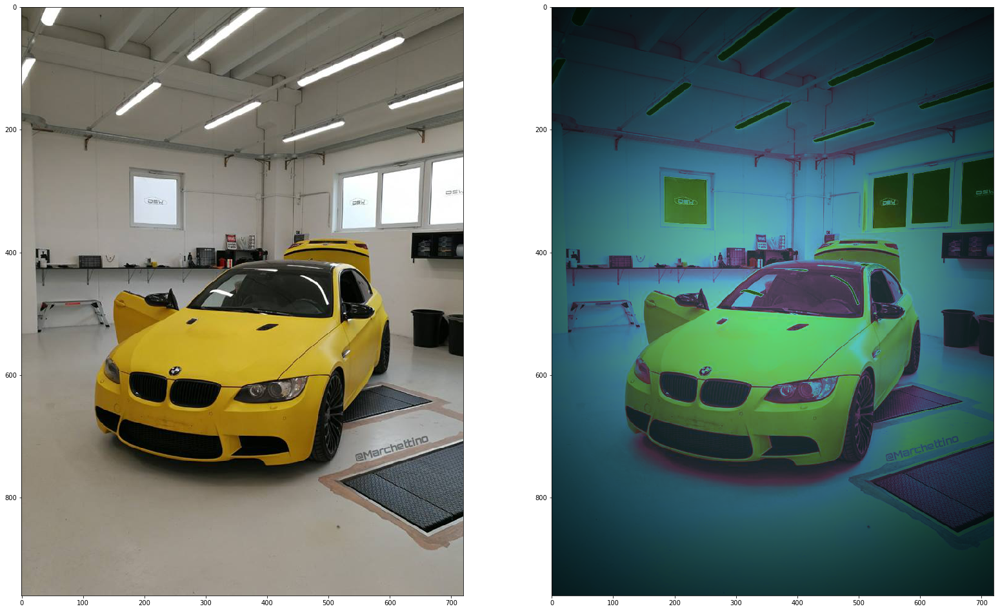

In [11]:
## Create Filter | This function takes custom parameters from the user to customize their own filter using the various
## functions built above.
def _create_filter(image, sharpen=False, kernel=np.array([[-1,-1,-1], [-1, 9,-1], [-1,-1,-1]]), noise=False, noise_prob=0, 
                   contrast=False, color_filter=False, color_set="", vignette=False, std=0, gain=0, temp_filter=False, 
                   temp_type="", cartoonify=False):
    # add sharpening
    if sharpen == True:
        sharpened = _sharpen(image, kernel)
    else:
        sharpened = image
    
    # add noise
    if noise == True:
        noisy = _add_pnoise(sharpened, noise_prob)
    else:
        noisy = sharpened

    # change colors
    if color_filter == True:
        colored = _add_color_filter(noisy, color_set)
    else:
        colored = noisy

    # adjust contrast
    if contrast == True:
        contrasted = _adjust_contrast(colored)
    else:
        contrasted = colored
        
    # add vignette
    if vignette == True:
        darkened = _vignette_filter(colored, std, gain)
    else:
        darkened = colored

    # change temperature
    if temp_filter == True:
        temped = _temperature_filter(darkened, temp_type)
    else:
        temped = darkened

    # add cartoon effect
    if cartoonify == True:
        cartooned = _cartoonify_filter(temped)
    else:
        cartooned = temped

    output = cartooned
    return output
    
in_img = cv2.imread('input.jpg')
out_img = _create_filter(image=in_img, sharpen=False, kernel=np.array([[-1,-1,-1], [-1, 9,-1], [-1,-1,-1]]), noise=False,
                         noise_prob=0, contrast=True, color_filter=True, color_set="Orion", vignette=True,
                         std=300, gain=500, temp_filter=True, temp_type="cool", cartoonify=False);
plt.subplot(121)
plt.imshow(cv2.cvtColor(in_img, cv2.COLOR_BGR2RGB))
plt.subplot(122)
plt.imshow(cv2.cvtColor(out_img, cv2.COLOR_BGR2RGB))
plt.show()

+ ### Insta-Like Deliverable
This wrapper function takes the image and the filter name as input. It contains five pre-built options to choose from that are constructed using the above function.

In [12]:
def _insta_like(image, filter_name):
    if filter_name == "Sunburst":
        output = _create_filter(image=in_img, sharpen=False, kernel=np.array([[-1,-1,-1], [-1, 9,-1], [-1,-1,-1]]), noise=True,
                         noise_prob=0.005, contrast=False, color_filter=True, color_set="Sunburst", vignette=True,
                         std=300, gain=500, temp_filter=True, temp_type="warm", cartoonify=False);
        
    elif filter_name == "Moonlight":
        output = _create_filter(image=in_img, sharpen=True, kernel=np.array([[-1,-1,-1], [-1, 9,-1], [-1,-1,-1]]), noise=False,
                         noise_prob=0, contrast=True, color_filter=True, color_set="Moonlight", vignette=False,
                         std=300, gain=500, temp_filter=True, temp_type="cool", cartoonify=False);
    
    elif filter_name == "Orion":
        output = _create_filter(image=in_img, sharpen=False, kernel=np.array([[-1,-1,-1], [-1, 9,-1], [-1,-1,-1]]), noise=False,
                         noise_prob=0, contrast=True, color_filter=True, color_set="Orion", vignette=True,
                         std=300, gain=500, temp_filter=True, temp_type="cool", cartoonify=True);
        
    elif filter_name == "Summer Garden":
        output = _create_filter(image=in_img, sharpen=False, kernel=np.array([[-1,-1,-1], [-1, 9,-1], [-1,-1,-1]]), noise=True,
                         noise_prob=0.01, contrast=True, color_filter=True, color_set="Summer Garden", vignette=False,
                         std=300, gain=500, temp_filter=True, temp_type="none", cartoonify=False);
        
    elif filter_name == "Steampunk":
        output = _create_filter(image=in_img, sharpen=False, kernel=np.array([[-1,-1,-1], [-1, 9,-1], [-1,-1,-1]]), noise=False,
                         noise_prob=0, contrast=True, color_filter=True, color_set="Steampunk", vignette=True,
                         std=300, gain=550, temp_filter=True, temp_type="warm", cartoonify=False);
    
    else:
        print "Filter Not Found!"
        
    return output

## <span style="color:green">Assignment Output Preview</span>
<span style="color:green">Main function that previews all five filters that were built in the above code.</span>

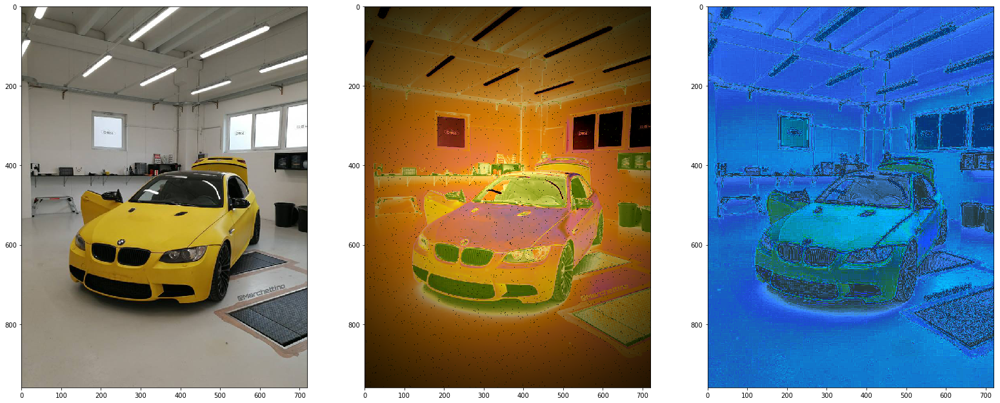

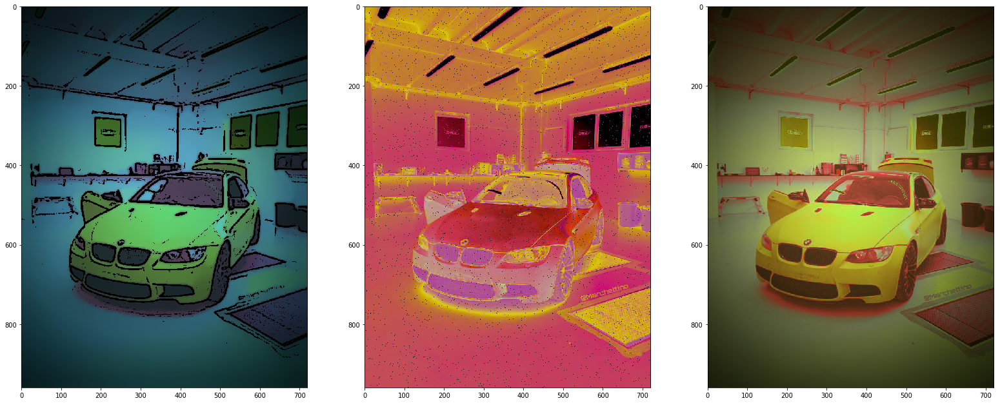

In [13]:
## Preview for all five pre-designed filters
if __name__ == "__main__":
    in_img = cv2.imread('input.jpg')
    Sunburst = _insta_like(in_img, "Sunburst")
    Moonlight = _insta_like(in_img, "Moonlight")
    Orion = _insta_like(in_img, "Orion")
    Summer = _insta_like(in_img, "Summer Garden")
    Steampunk = _insta_like(in_img, "Steampunk")
    plt.subplot(131)
    plt.imshow(cv2.cvtColor(in_img, cv2.COLOR_BGR2RGB))
    plt.subplot(132)
    plt.imshow(cv2.cvtColor(Sunburst, cv2.COLOR_BGR2RGB))
    plt.subplot(133)
    plt.imshow(cv2.cvtColor(Moonlight, cv2.COLOR_BGR2RGB))
    plt.show()  
    plt.subplot(231)
    plt.imshow(cv2.cvtColor(Orion, cv2.COLOR_BGR2RGB))
    plt.subplot(232)
    plt.imshow(cv2.cvtColor(Summer, cv2.COLOR_BGR2RGB))
    plt.subplot(233)
    plt.imshow(cv2.cvtColor(Steampunk, cv2.COLOR_BGR2RGB))
    plt.show()   